1. Importacion y descargas de librerias 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot
import plotly.express as px

import os
import json
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning)

# Mapas interactivos
import folium  
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

# Para hacer graficas plotly
import plotly.graph_objects as go
import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks 
import plotly.io as pio
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

# text mining
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud

# Warnings
import warnings
warnings.filterwarnings('ignore')

2. Generación y limpieza de los Dataframes

In [2]:
calendar = pd.read_csv('calendar.csv', sep=',',) #Leemos los datos

In [3]:
calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,21853,2024-09-11,f,$30.00,NaN,4,40
1,21853,2024-09-12,f,$30.00,NaN,4,40
2,21853,2024-09-13,f,$30.00,NaN,4,40
3,21853,2024-09-14,f,$30.00,NaN,4,40
4,21853,2024-09-15,f,$30.00,NaN,4,40


In [4]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9847608 entries, 0 to 9847607
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  float64
 5   minimum_nights  int64  
 6   maximum_nights  int64  
dtypes: float64(1), int64(3), object(3)
memory usage: 525.9+ MB


In [5]:
# ordeno en orden decreciente las variables por la cantidad de valores nulos
calendarisnull = calendar.isnull().sum().sort_values(ascending=False)
print(calendarisnull)

adjusted_price    9847608
listing_id              0
date                    0
available               0
price                   0
minimum_nights          0
maximum_nights          0
dtype: int64


In [6]:
# Convierto columnas de fecha a tipo datetime
calendar['date'] = pd.to_datetime(calendar['date'])
# Convierto columna 'available' a tipo booleano (suponiendo que los valores son 't'/'f')
calendar['available'] = calendar['available'].apply(lambda x: 1 if x == 't' else 0)
# Convierto columna de precio a tipo float
calendar['price'] = calendar['price'].replace('[\$,]', '', regex=True).astype(float)


In [7]:
valores_unicos_available = calendar['available'].unique()

# Muestro los valores únicos
print(valores_unicos_available)

[0 1]


In [8]:
calendar.drop(columns=['adjusted_price'], inplace=True)

# Verifico que la columna ha sido eliminada
print(calendar.head())

   listing_id       date  available  price  minimum_nights  maximum_nights
0       21853 2024-09-11          0   30.0               4              40
1       21853 2024-09-12          0   30.0               4              40
2       21853 2024-09-13          0   30.0               4              40
3       21853 2024-09-14          0   30.0               4              40
4       21853 2024-09-15          0   30.0               4              40


In [9]:
# Guardo el DataFrame en un archivo CSV
calendar.to_csv('datos_limpios_calendar.csv', index=False)

# Verifico que el archivo se ha guardado correctamente
print("Archivo guardado como 'datos_limpios_calendar.csv'")

Archivo guardado como 'datos_limpios_calendar.csv'


In [10]:
reviews = pd.read_csv('reviews.csv', sep=',') #Leo los datos

In [11]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,21853,21051116,2014-10-10,8506071,Pedro Abel,"Mi experiencia en casa de Adel fue buena, aunq..."
1,21853,21268157,2014-10-13,19062863,Olga,Adel is a very warm person and thoughtful! He...
2,21853,22527396,2014-11-09,6099461,Hugh,Adel is an exceptionally welcoming host. I was...
3,21853,22684525,2014-11-11,23357657,Sendy,"Adel fue muy amable, incluso el día de mi lleg..."
4,21853,22871843,2014-11-16,4072731,Nati,Abdel ha sido un magnífico anfitrión y la mejo...


In [12]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1229427 entries, 0 to 1229426
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   listing_id     1229427 non-null  int64 
 1   id             1229427 non-null  int64 
 2   date           1229427 non-null  object
 3   reviewer_id    1229427 non-null  int64 
 4   reviewer_name  1229424 non-null  object
 5   comments       1229329 non-null  object
dtypes: int64(3), object(3)
memory usage: 56.3+ MB


In [13]:
# Ordeno en orden decreciente las variables por la cantidad de valores nulos
reviewsisnull = reviews.isnull().sum().sort_values(ascending=False)
print(reviewsisnull)

comments         98
reviewer_name     3
listing_id        0
id                0
date              0
reviewer_id       0
dtype: int64


In [14]:
listings = pd.read_csv('listings.csv', sep=',') #Leo los datos

In [15]:
listings.head()
pd.set_option('display.max_columns', None)
listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,920645654779749874,https://www.airbnb.com/rooms/920645654779749874,20240911015516,2024-09-11,previous scrape,modern appartment in downtown,Amazing modern and quite apparment in the hear...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,17728398,https://www.airbnb.com/users/show/17728398,Raul,2014-07-06,"Madrid, Spain",I am a nice guy living in Madrid. I love meeti...,NaN,NaN,100%,f,https://a0.muscache.com/im/pictures/user/c79e3...,https://a0.muscache.com/im/pictures/user/c79e3...,NaN,1.0,4.0,"['email', 'phone']",t,t,NaN,Cortes,Centro,40.412572,-3.695751,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,NaN,"[""Wifi"", ""Washer"", ""Kitchen"", ""TV""]",NaN,120,365,120,120,365,365,120.0,365.0,NaN,t,29,59,89,89,2024-09-11,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,t,1,1,0,0,NaN
1,889210192192502279,https://www.airbnb.com/rooms/889210192192502279,20240911015516,2024-09-11,previous scrape,Bonita habitación en Atocha,Break up with your day-to-day life and relax i...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,448890645,https://www.airbnb.com/users/show/448890645,Salomé,2022-03-10,NaN,NaN,a few days or more,32%,32%,f,https://a0.muscache.com/im/pictures/user/ab165...,https://a0.muscache.com/im/pictures/user/ab165...,NaN,49.0,70.0,"['email', 'phone']",t,t,NaN,Palos de Moguer,Arganzuela,40.403840,-3.691680,Private room in rental unit,Private room,1,NaN,1 bath,NaN,NaN,"[""Lock on bedroom door"", ""Washer"", ""Kitchen"", ...",NaN,5,365,5,5,365,365,5.0,365.0,NaN,t,0,0,0,0,2024-09-11,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,45,5,40,0,NaN
2,40774969,https://www.airbnb.com/rooms/40774969,20240911015516,2024-09-11,previous scrape,Habitacion individual junto al Auditorio Nacional,"Economical, simple and central room, next to A...",NaN,https://a0.muscache.com/pictures/c58cfe93-ed90...,316778938,https://www.airbnb.com/users/show/316778938,Amaya,2019-12-12,NaN,NaN,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/df4e9...,https://a0.muscache.com/im/pictures/user/df4e9...,Prosperidad,1.0,1.0,"['email', 'phone']",t,f,NaN,Prosperidad,Chamartín,40.443420,-3.674340,Private room in rental unit,Private room,2,NaN,1 shared bath,NaN,NaN,"[""Heating"", ""Shampoo"", ""Hangers"", ""Fire exting...",NaN,2,1125,2,2,1125,1125,2.0,1125.0,NaN,NaN,0,0,0,0,2024-09-11,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
3,19406581,https://www.airbnb.com/rooms/19406581,20240911015516,2024-09-11,previous scrape,Barni,"Flat with two bedrooms, I rent one with 1.35 b...",NaN,https://a0.muscache.com/pictures/bb9c6c4b-410c...,136049113,https://www.airbnb.com/users/show/136049113,Eva,2017-06-20,"Madrid, Spain",NaN,NaN,NaN,NaN,f,https:

In [16]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26980 entries, 0 to 26979
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            26980 non-null  int64  
 1   listing_url                                   26980 non-null  object 
 2   scrape_id                                     26980 non-null  int64  
 3   last_scraped                                  26980 non-null  object 
 4   source                                        26980 non-null  object 
 5   name                                          26980 non-null  object 
 6   description                                   25773 non-null  object 
 7   neighborhood_overview                         12749 non-null  object 
 8   picture_url                                   26979 non-null  object 
 9   host_id                                       26980 non-null 

In [17]:
listingsisnull = listings.isnull().sum().sort_values(ascending=False)
print(listingsisnull)

calendar_updated                26980
license                         24350
host_neighbourhood              17579
neighborhood_overview           14231
neighbourhood                   14231
                                ...  
latitude                            0
neighbourhood_group_cleansed        0
availability_30                     0
availability_60                     0
id                                  0
Length: 75, dtype: int64


In [18]:
# Calculo el porcentaje de valores nulos en cada columna
null_percentage = listings.isnull().mean() * 100

# Filtro las columnas que tienen más del 50% de valores nulos
columns_with_high_nulls = null_percentage[null_percentage > 30]

# Muestro el resultado
print(columns_with_high_nulls)

neighborhood_overview     52.746479
host_location             30.070423
host_about                50.885841
host_neighbourhood        65.155671
neighbourhood             52.746479
calendar_updated         100.000000
license                   90.252039
dtype: float64


In [19]:
# Elimino las columnas especificadas
columns_to_drop = ['availability_90', 'availability_60', 'availability_30', 'has_availability', 'minimum_nights_avg_ntm', 'bathrooms_text', 'bedrooms', 'license', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description', 'neighborhood_overview', 'picture_url', 'host_url', 'host_about', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_has_profile_pic', 'neighbourhood_cleansed', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'maximum_nights_avg_ntm', 'calendar_updated', 'calendar_last_scraped', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review', 'last_review', 'review_scores_accuracy',  'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'reviews_per_month']
listings.drop(columns=columns_to_drop, inplace=True)

# Verifico que las columnas han sido eliminadas
listings.head()

,id,source,host_id,host_name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_identity_verified,neighbourhood,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,beds,amenities,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating,instant_bookable
0,920645654779749874,previous scrape,17728398,Raul,2014-07-06,"Madrid, Spain",NaN,NaN,100%,f,4.0,"['email', 'phone']",t,NaN,Centro,40.412572,-3.695751,Entire rental unit,Entire home/apt,4,NaN,NaN,"[""Wifi"", ""Washer"", ""Kitchen"", ""TV""]",NaN,120,365,89,0,NaN,t
1,889210192192502279,previous scrape,448890645,Salomé,2022-03-10,NaN,a few days or more,32%,32%,f,70.0,"['email', 'phone']",t,NaN,Arganzuela,40.403840,-3.691680,Private room in rental unit,Private room,1,NaN,NaN,"[""Lock on bedroom door"", ""Washer"", ""Kitchen"", ...",NaN,5,365,0,0,NaN,f
2,40774969,previous scrape,316778938,Amaya,2019-12-12,NaN,NaN,NaN,NaN,f,1.0,"['email', 'phone']",f,NaN,Chamartín,40.443420,-3.674340,Private room in rental unit,Private room,2,NaN,NaN,"[""Heating"", ""Shampoo"", ""Hangers"", ""Fire exting...",NaN,2,1125,0,0,NaN,f
3,19406581,previous scrape,136049113,Eva,2017-06-20,"Madrid, Spain",NaN,NaN,NaN,f,1.0,"['email', 'phone']",f,NaN,Centro,40.424580,-3.700770,Private room in home,Private room,2,NaN,NaN,"[""Air conditioning"", ""Hair dryer"", ""Wifi"", ""Ha...",NaN,3,3,0,0,NaN,f
4,19495912,previous scrape,136874483,Leonardo,2017-06-25,NaN,NaN,NaN,NaN,f,1.0,"['email', 'phone']",f,NaN,Latina,40.394200,-3.741880,Private room in home,Private room,2,NaN,NaN,"[""Wifi"", ""Kitchen"", ""TV""]",NaN,1,4,0,0,NaN,f


In [20]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26980 entries, 0 to 26979
Data columns (total 30 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            26980 non-null  int64  
 1   source                        26980 non-null  object 
 2   host_id                       26980 non-null  int64  
 3   host_name                     26977 non-null  object 
 4   host_since                    26977 non-null  object 
 5   host_location                 18867 non-null  object 
 6   host_response_time            21719 non-null  object 
 7   host_response_rate            21719 non-null  object 
 8   host_acceptance_rate          22784 non-null  object 
 9   host_is_superhost             26001 non-null  object 
 10  host_total_listings_count     26977 non-null  float64
 11  host_verifications            26977 non-null  object 
 12  host_identity_verified        26977 non-null  object 
 13  n

Conversión de Tipos de Datos:

In [21]:
# Convierto columnas de fecha a tipo datetime
listings['host_since'] = pd.to_datetime(listings['host_since'])

# Me aseguro de que las columnas de porcentaje sean de tipo string y manejar valores nulos
listings['host_response_rate'] = listings['host_response_rate'].astype(str).str.rstrip('%').astype(float) / 100
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype(str).str.rstrip('%').astype(float) / 100

# Convierto columna de precio a tipo float
listings['price'] = listings['price'].replace('[\$,]', '', regex=True).astype(float)

# Verifico los cambios
print(listings.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26980 entries, 0 to 26979
Data columns (total 30 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id                            26980 non-null  int64         
 1   source                        26980 non-null  object        
 2   host_id                       26980 non-null  int64         
 3   host_name                     26977 non-null  object        
 4   host_since                    26977 non-null  datetime64[ns]
 5   host_location                 18867 non-null  object        
 6   host_response_time            21719 non-null  object        
 7   host_response_rate            21719 non-null  float64       
 8   host_acceptance_rate          22784 non-null  float64       
 9   host_is_superhost             26001 non-null  object        
 10  host_total_listings_count     26977 non-null  float64       
 11  host_verifications          

Manejo de los valores nulos

In [22]:
# Imputo valores nulos con la moda para columnas categóricas
categorical_columns = ['host_name', 'host_location', 'host_response_time', 'host_is_superhost', 'host_verifications', 'host_identity_verified', 'neighbourhood', 'instant_bookable', 'neighbourhood_group_cleansed']
for column in categorical_columns:
    listings[column].fillna(listings[column].mode()[0], inplace=True)

# Imputo valores nulos con la media para columnas numéricas
numerical_columns = ['price', 'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count', 'bathrooms', 'beds', 'review_scores_rating']
for column in numerical_columns:
    listings[column].fillna(listings[column].mean(), inplace=True)

# Elimino filas con valores nulos en 'host_since'
listings.dropna(subset=['host_since'], inplace=True)

# Verifico los cambios
print(listings.info())

<class 'pandas.core.frame.DataFrame'>
Index: 26977 entries, 0 to 26979
Data columns (total 30 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   id                            26977 non-null  int64         
 1   source                        26977 non-null  object        
 2   host_id                       26977 non-null  int64         
 3   host_name                     26977 non-null  object        
 4   host_since                    26977 non-null  datetime64[ns]
 5   host_location                 26977 non-null  object        
 6   host_response_time            26977 non-null  object        
 7   host_response_rate            26977 non-null  float64       
 8   host_acceptance_rate          26977 non-null  float64       
 9   host_is_superhost             26977 non-null  object        
 10  host_total_listings_count     26977 non-null  float64       
 11  host_verifications            269

In [23]:
# Selecciono las columnas numéricas, excluyendo latitud y longitud
numeric_cols = listings.select_dtypes(include=['float64', 'int64']).columns
numeric_cols = numeric_cols.difference(['latitude', 'longitude'])

# Redondeo las columnas numéricas a dos decimales
listings[numeric_cols] = listings[numeric_cols].round(2)


In [24]:
# Guardo el DataFrame en un archivo CSV
listings.to_csv('datos_limpios_listings.csv', index=False)

# Verifico que el archivo se ha guardado correctamente
print("Archivo guardado como 'datos_limpios_listings.csv'")

Archivo guardado como 'datos_limpios_listings.csv'


array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'host_id'}>,
        <Axes: title={'center': 'host_since'}>,
        <Axes: title={'center': 'host_response_rate'}>],
       [<Axes: title={'center': 'host_acceptance_rate'}>,
        <Axes: title={'center': 'host_total_listings_count'}>,
        <Axes: title={'center': 'latitude'}>,
        <Axes: title={'center': 'longitude'}>],
       [<Axes: title={'center': 'accommodates'}>,
        <Axes: title={'center': 'bathrooms'}>,
        <Axes: title={'center': 'beds'}>,
        <Axes: title={'center': 'price'}>],
       [<Axes: title={'center': 'minimum_nights'}>,
        <Axes: title={'center': 'maximum_nights'}>,
        <Axes: title={'center': 'availability_365'}>,
        <Axes: title={'center': 'number_of_reviews'}>],
       [<Axes: title={'center': 'review_scores_rating'}>, <Axes: >,
        <Axes: >, <Axes: >]], dtype=object)

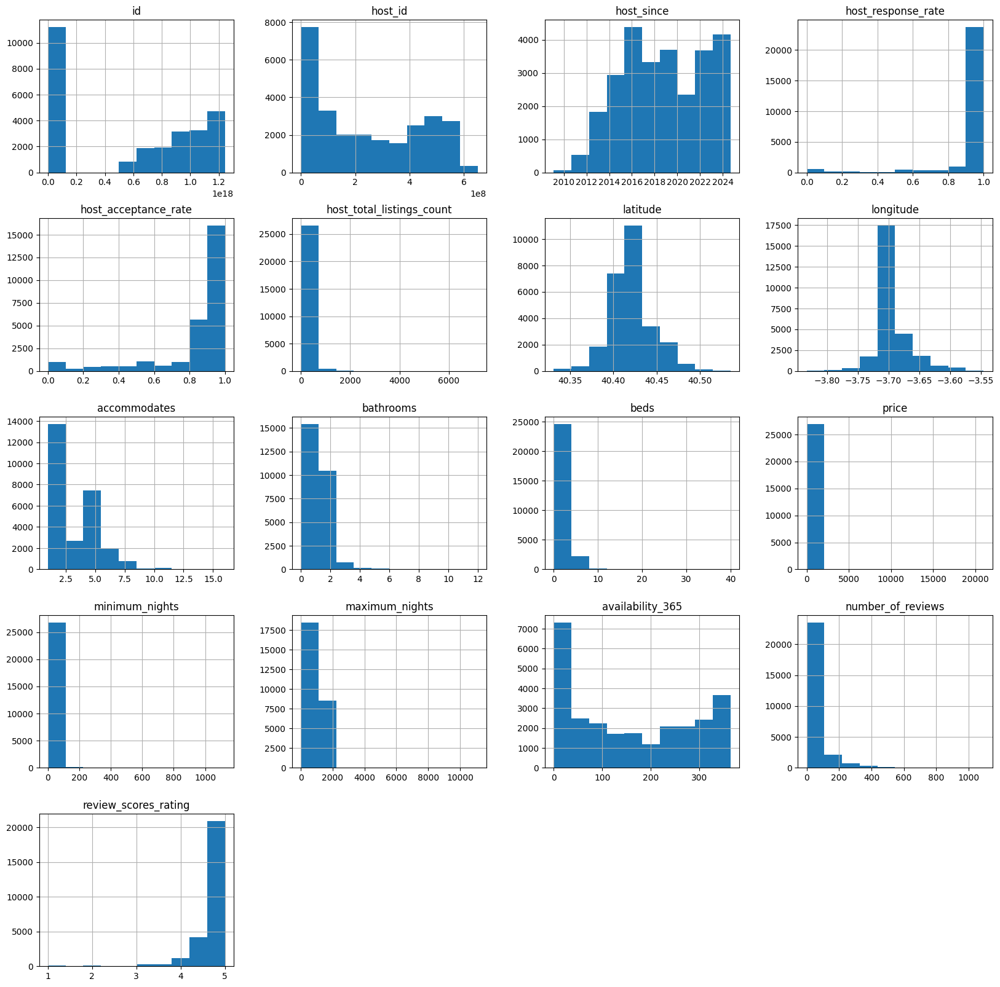

In [25]:
# Histagrama de las variables numéricas 
listings.hist(figsize=(20, 20))

In [26]:
# Selecciono solo las columnas numéricas
numeric_columns = [
    'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count',
    'accommodates', 'bathrooms', 'beds', 'price',
    'minimum_nights', 'maximum_nights', 'availability_365', 'number_of_reviews',
    'review_scores_rating'
]

# Obtengo el resumen estadístico de las columnas numéricas
listings[numeric_columns].describe()

,host_response_rate,host_acceptance_rate,host_total_listings_count,accommodates,bathrooms,beds,price,minimum_nights,maximum_nights,availability_365,number_of_reviews,review_scores_rating
count,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000,26977.000000
mean,0.921461,0.846640,52.905178,3.119657,1.297831,1.968055,140.598784,8.072654,535.810987,156.228899,45.573155,4.650689
std,0.185553,0.244837,163.731546,1.893652,0.588373,1.319155,329.981687,30.824842,431.668281,128.593248,86.601434,0.425289
min,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000
25%,0.920000,0.850000,2.000000,2.000000,1.000000,1.000000,75.000000,1.000000,330.000000,26.000000,1.000000,4.630000
50%,1.000000,0.970000,5.000000,2.000000,1.000000,1.970000,127.000000,2.000000,365.000000,140.000000,10.000000,4.670000
75%,1.000000,1.000000,28.000000,4.000000,1.300000,2.000000,140.600000,3.000000,1125.000000,276.000000,49.000000,4.880000
max,1.000000,1.000000,7172.000000,16.000000,12.000000,40.000000,21000.000000,1125.000000,11111.000000,365.000000,1092.000000,5.000000


                 id       host_id                     host_since  \
count  1.092000e+04  1.092000e+04                          10920   
mean   5.187189e+17  2.302356e+08  2018-07-08 22:21:05.934066176   
min    2.480500e+04  3.162200e+04            2009-08-14 00:00:00   
25%    3.401422e+07  4.746221e+07            2015-10-28 00:00:00   
50%    6.402347e+17  1.781978e+08            2018-03-13 12:00:00   
75%    1.014412e+18  4.298831e+08            2021-11-01 00:00:00   
max    1.242075e+18  6.510869e+08            2024-09-09 00:00:00   
std    5.007071e+17  1.965710e+08                            NaN   

       host_response_rate  host_acceptance_rate  host_total_listings_count  \
count        10920.000000          10920.000000               10920.000000   
mean             0.966147              0.923451                   6.621154   
min              0.800000              0.630000                   1.000000   
25%              0.920000              0.850000                   1.000000 

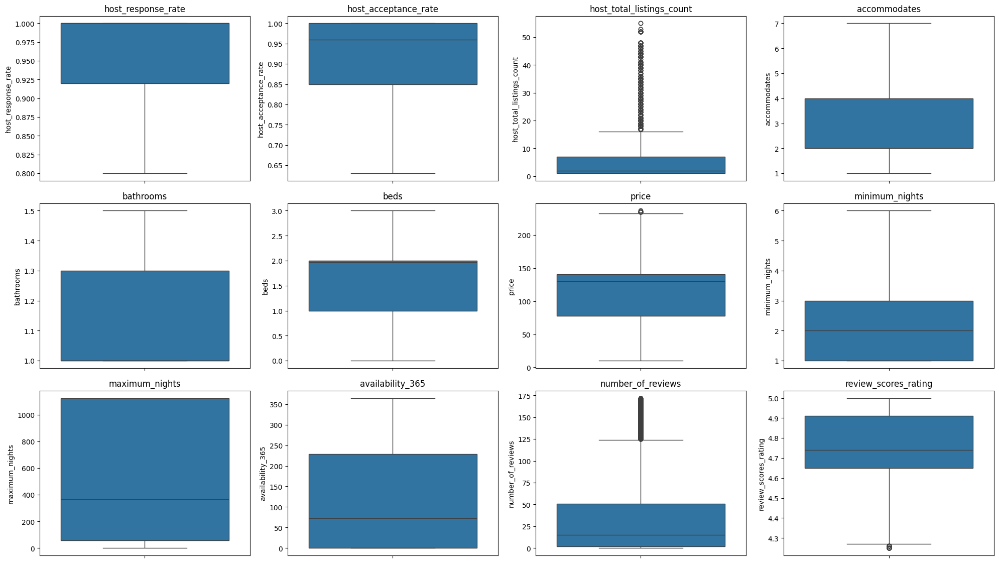

In [27]:
# Selecciono las columnas numéricas específicas
numeric_columns = [
    'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count',
    'accommodates', 'bathrooms', 'beds', 'price',
    'minimum_nights', 'maximum_nights', 'availability_365', 'number_of_reviews',
    'review_scores_rating'
]

# Función para identificar y eliminar outliers usando el método IQR
def remove_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# Elimino outliers de las columnas numéricas
listings_cleaned = remove_outliers(listings, numeric_columns)

# Verifico el resultado
print(listings_cleaned.describe())

# Creo un diagrama de cajas para cada columna numérica después de eliminar outliers

plt.figure(figsize=(20, 15))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(y=listings_cleaned[column])
    plt.title(column)

plt.tight_layout()
plt.show()

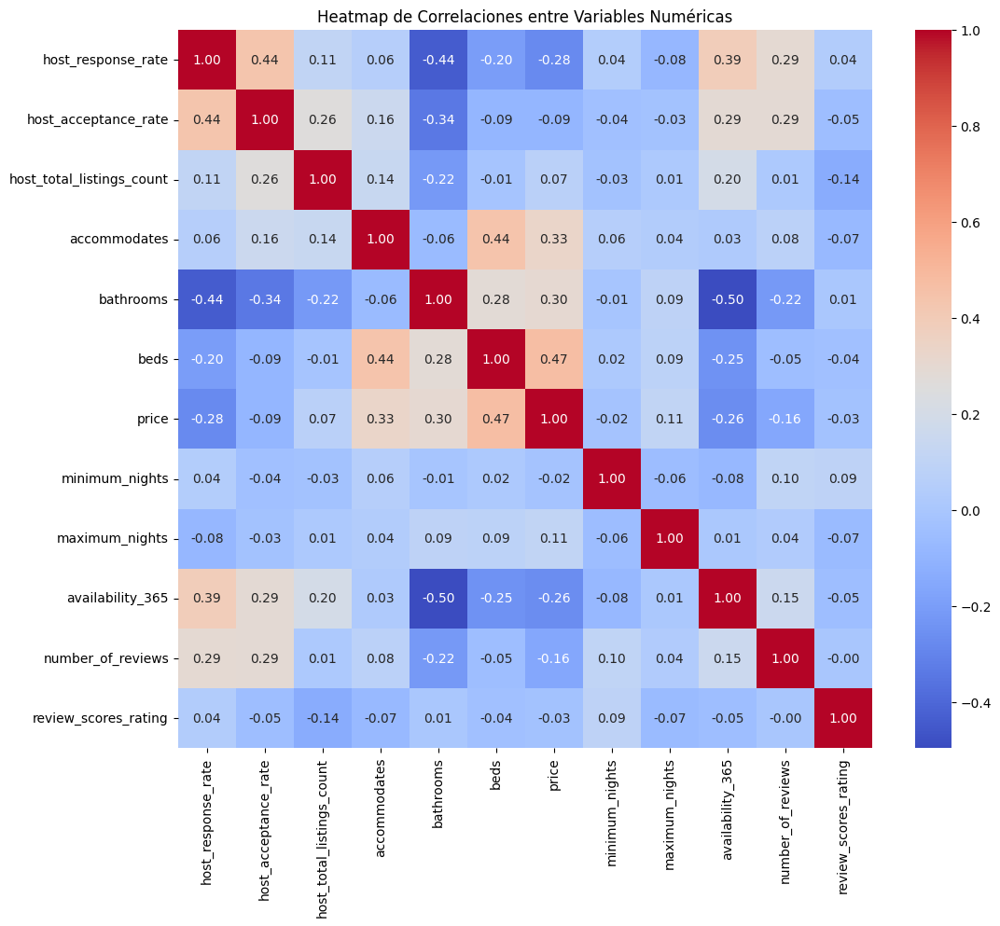

In [28]:
# Seleccionar las columnas numéricas específicas
numeric_columns = [
    'host_response_rate', 'host_acceptance_rate', 'host_total_listings_count',
    'accommodates', 'bathrooms', 'beds', 'price',
    'minimum_nights', 'maximum_nights', 'availability_365', 'number_of_reviews',
    'review_scores_rating'
]

# Calcular la matriz de correlación
correlation_matrix = listings_cleaned[numeric_columns].corr()

# Crear un heatmap a partir de la matriz de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Heatmap de Correlaciones entre Variables Numéricas")
plt.show()

In [29]:
# Guardo el DataFrame en un archivo CSV
listings_cleaned.to_csv('datos_limpios_listings.csv', index=False)

# Verifico que el archivo se ha guardado correctamente
print("Archivo guardado como 'datos_limpios_listings.csv'")

Archivo guardado como 'datos_limpios_listings.csv'


3. Análisis exploratorio

3.1 Análisis de localización

In [30]:
listings_cleaned['room_type'].value_counts()

room_type
Entire home/apt    6210
Private room       4564
Shared room          84
Hotel room           62
Name: count, dtype: int64

In [31]:
listings_cleaned['room_type'].value_counts() / listings_cleaned.shape[0] * 100

room_type
Entire home/apt    56.868132
Private room       41.794872
Shared room         0.769231
Hotel room          0.567766
Name: count, dtype: float64

Podemos observar que más de la mitad de los alojamientos ofrecidos en Airbnb son de apartementos enteros

In [32]:
listings_cleaned['property_type'].value_counts()

property_type
Entire rental unit                    5332
Private room in rental unit           3320
Private room in home                   431
Entire loft                            282
Entire condo                           253
Private room in condo                  197
Entire home                            129
Private room in hostel                 120
Entire serviced apartment              117
Room in hotel                          104
Private room in casa particular        101
Private room in bed and breakfast       73
Shared room in rental unit              36
Private room                            34
Room in boutique hotel                  33
Room in hostel                          29
Private room in guesthouse              29
Private room in guest suite             28
Private room in loft                    23
Entire guest suite                      23
Private room in serviced apartment      19
Private room in chalet                  19
Room in aparthotel                      

In [33]:
# Creo un gráfico de barras apiladas para mostrar la relación entre el tipo de propiedad y el tipo de habitación
fig = px.histogram(listings_cleaned, x='property_type', color='room_type', barmode='stack',
                   title='Distribución de Tipos de Propiedad y Tipos de Habitación',
                   labels={'property_type': 'Tipo de Propiedad', 'count': 'Conteo', 'room_type': 'Tipo de Habitación'},
                   color_discrete_sequence=px.colors.qualitative.Vivid)

# Ajusto el diseño del gráfico
fig.update_layout(xaxis_title='Tipo de Propiedad', yaxis_title='Conteo', xaxis={'categoryorder':'total descending'})
fig.update_xaxes(tickangle=45)

# Muestro el gráfico
fig.show()

In [34]:
listings_cleaned.groupby('neighbourhood_group_cleansed').price.mean().sort_values(ascending=False)

neighbourhood_group_cleansed
Centro                   124.611986
Salamanca                123.902280
Chamberí                 122.223035
Chamartín                113.939818
Arganzuela               110.098326
Retiro                   109.906707
Tetuán                   107.837480
Moncloa - Aravaca        107.423776
San Blas - Canillejas    105.115976
Hortaleza                100.007805
Fuencarral - El Pardo     97.821277
Villaverde                97.178523
Ciudad Lineal             95.473303
Barajas                   95.143182
Moratalaz                 92.702083
Carabanchel               89.501695
Latina                    89.361039
Villa de Vallecas         88.150000
Puente de Vallecas        85.536316
Usera                     84.910853
Vicálvaro                 82.400000
Name: price, dtype: float64

Aqui podemos observar el precio medio que cuesta por noche estar en cada uno de los diferentes barrios

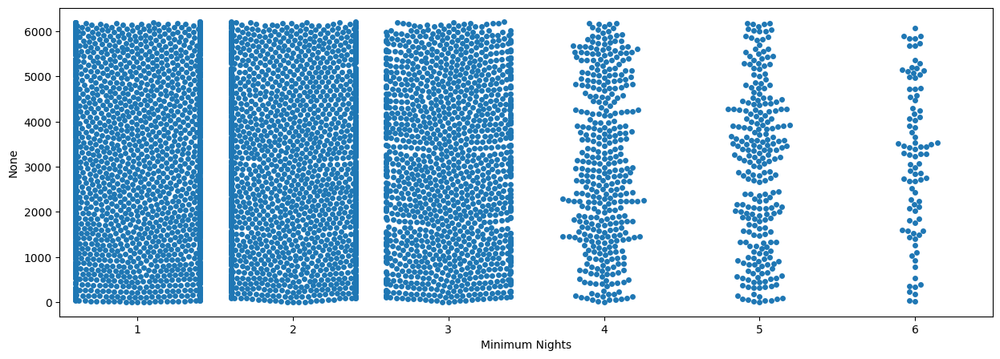

In [35]:
# Filtramos y reseteamos el índice
entire_home_listings = listings_cleaned[listings_cleaned['room_type'] == 'Entire home/apt']['minimum_nights'].reset_index()

# Creamos la figura y el eje
f, ax = plt.subplots(figsize=(15, 5))

# Hacemos el gráfico de dispersión con swarmplot
sns.swarmplot(x=entire_home_listings['minimum_nights'], y=entire_home_listings.index, ax=ax)

# Añadimos el título y las etiquetas
plt.xlabel('Minimum Nights')

# Mostramos la gráfica
plt.show()

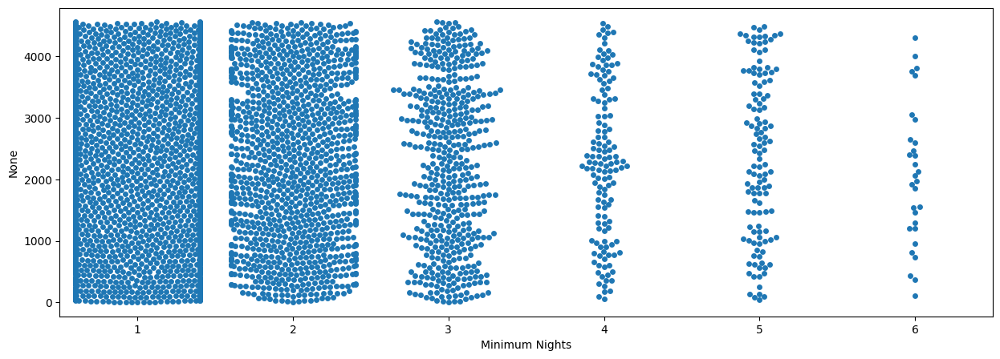

In [36]:
# Filtramos y reseteamos el índice
private_room_listings = listings_cleaned[listings_cleaned['room_type'] == 'Private room']['minimum_nights'].reset_index()

# Creamos la figura y el eje
f, ax = plt.subplots(figsize=(15, 5))

# Hacemos el gráfico de dispersión con swarmplot
sns.swarmplot(x=private_room_listings['minimum_nights'], y=private_room_listings.index, ax=ax)

# Añadimos el título y las etiquetas
plt.xlabel('Minimum Nights')

# Mostramos la gráfica
plt.show()

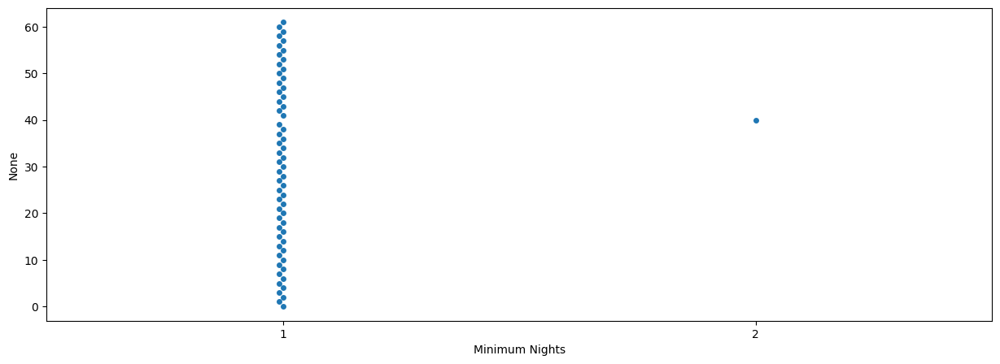

In [37]:
# Filtramos y reseteamos el índice
hotel_room_listings = listings_cleaned[listings_cleaned['room_type'] == 'Hotel room']['minimum_nights'].reset_index()

# Creamos la figura y el eje
f, ax = plt.subplots(figsize=(15, 5))

# Hacemos el gráfico de dispersión con swarmplot
sns.swarmplot(x=hotel_room_listings['minimum_nights'], y=hotel_room_listings.index, ax=ax)

# Añadimos el título y las etiquetas
plt.xlabel('Minimum Nights')

# Mostramos la gráfica
plt.show()

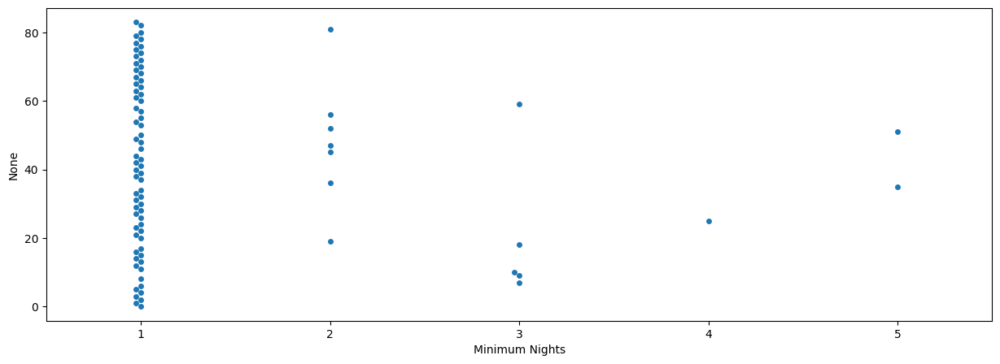

In [38]:
# Filtramos y reseteamos el índice
shared_room_listings = listings_cleaned[listings_cleaned['room_type'] == 'Shared room']['minimum_nights'].reset_index()

# Creamos la figura y el eje
f, ax = plt.subplots(figsize=(15, 5))

# Hacemos el gráfico de dispersión con swarmplot
sns.swarmplot(x=shared_room_listings['minimum_nights'], y=shared_room_listings.index, ax=ax)

# Añadimos el título y las etiquetas
plt.xlabel('Minimum Nights')

# Mostramos la gráfica
plt.show()

En estos últimos 4 gráficos podemos observar la distribución de las noches mínimas requeridas por tipo de alojamiento

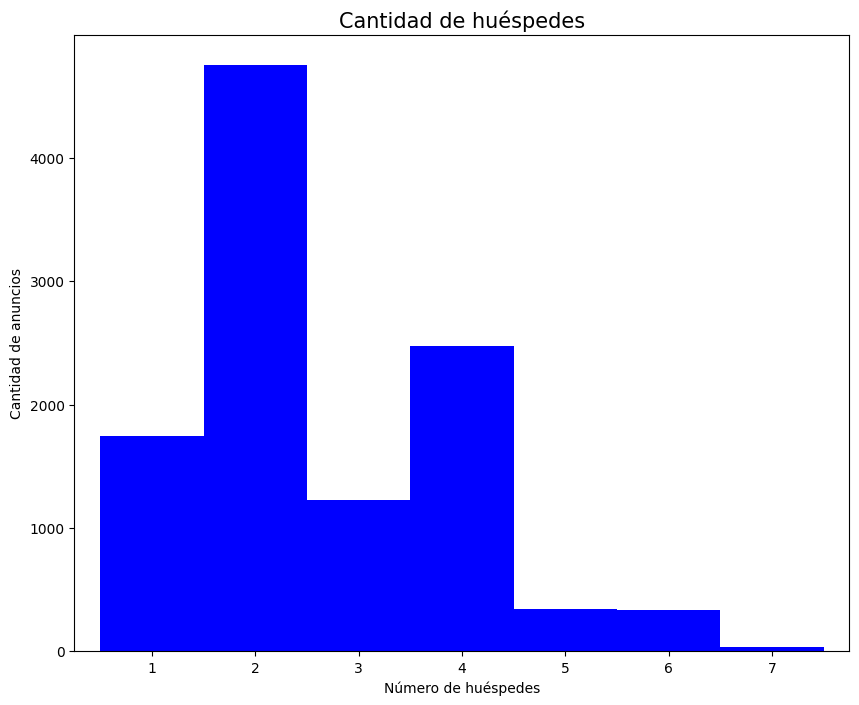

In [39]:
import pandas as pd
import matplotlib.pyplot as plt


# Cuento la cantidad de huéspedes y ordenar por índice
feq = listings_cleaned['accommodates'].value_counts().sort_index()

# Creo un gráfico de barras
feq.plot.bar(figsize=(10, 8), color='blue', width=1, rot=0)
plt.title('Cantidad de huéspedes', fontsize=15)
plt.xlabel('Número de huéspedes')
plt.ylabel('Cantidad de anuncios')
plt.show()

Aquí podemos observar la cantida de huéspedes que pueden ser acomodados en los alojamientos.

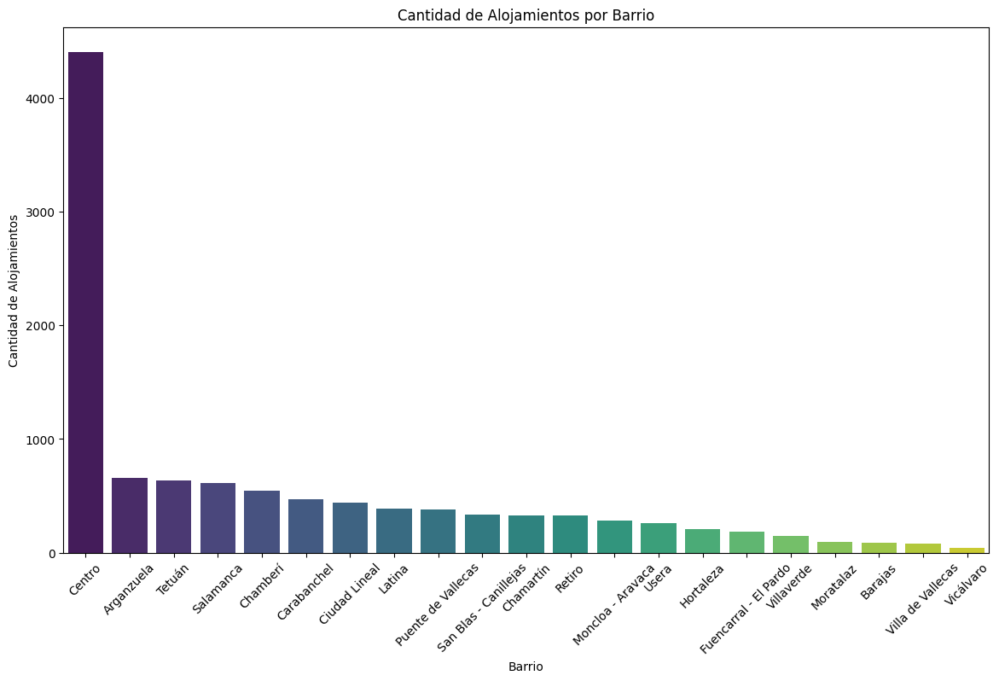

In [40]:
# Cuento la cantidad de alojamientos por barrio
alojamientos_por_barrio = listings_cleaned['neighbourhood_group_cleansed'].value_counts().sort_values(ascending=False)

# Convierto la serie a un DataFrame para facilitar la visualización
alojamientos_por_barrio_df = alojamientos_por_barrio.reset_index()
alojamientos_por_barrio_df.columns = ['neighbourhood_group_cleansed', 'count']

# Creo una gráfica de barras para mostrar la cantidad de alojamientos por barrio
plt.figure(figsize=(14, 8))
sns.barplot(data=alojamientos_por_barrio_df, x='neighbourhood_group_cleansed', y='count', palette='viridis')
plt.title('Cantidad de Alojamientos por Barrio')
plt.xlabel('Barrio')
plt.ylabel('Cantidad de Alojamientos')
plt.xticks(rotation=45)
plt.show()

En este gráfico observamos que el barrio del Centro de la Ciudad (Centro) es el que tiene la mayor cantidad de alojamientos, seguido por el barrio de Arganzuela y Tetuán.

<Axes: xlabel='longitude', ylabel='latitude'>

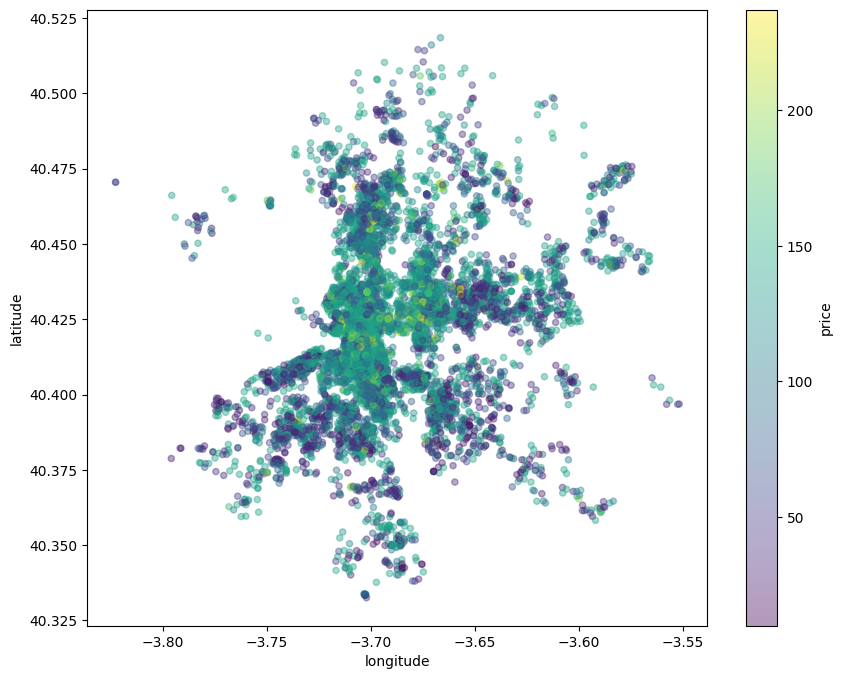

In [41]:
listings_cleaned.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4, figsize=(10, 8), c='price', cmap='viridis', colorbar=True, sharex=False)

Mediante este formato podemos ver la distribución de las ubicaciones de alquiler así como los precios distribuidos.

In [ ]:
import folium
from folium.plugins import MarkerCluster  # Usaremos MarkerCluster en lugar de FastMarkerCluster
 
# En lugar de convertir a listas separadas, trabajamos directamente con el DataFrame
map1 = folium.Map(location=[40.4165, -3.70256], zoom_start=12)
 
# Creamos un solo grupo de marcadores
marker_cluster = MarkerCluster()
 
# Itideramos sobre el DataFrame directamente usando itertuples (más eficiente que zip)
for row in listings_cleaned.itertuples():
    folium.Marker(
        location=[row.latitude, row.longitude],
        popup=f'Price: {row.price}'
    ).add_to(marker_cluster)
 
# Añadimos el cluster al mapa
marker_cluster.add_to(map1)
 
# Mostramos el mapa
map1

Podemos observar que la zona del centro de Madrid es la que tiene mayor oferta, seguidos de barrios perifericos donde destacá el barrio de la Latina, Usera y Puente de Vallecas 

3.2 Análisis de precios

In [43]:
# Calcular el precio máximo
precio_maximo = listings_cleaned['price'].max()

# Calcular el precio mínimo
precio_minimo = listings_cleaned['price'].min()

# Mostrar los resultados
print(f"El precio máximo es: {precio_maximo}")
print(f"El precio mínimo es: {precio_minimo}")

El precio máximo es: 237.0
El precio mínimo es: 10.0


In [44]:
precio_promedio = listings_cleaned['price'].mean()

# Muertro el resultado
print(f"El precio promedio de los alojamientos es: {precio_promedio:.2f}")

El precio promedio de los alojamientos es: 112.32


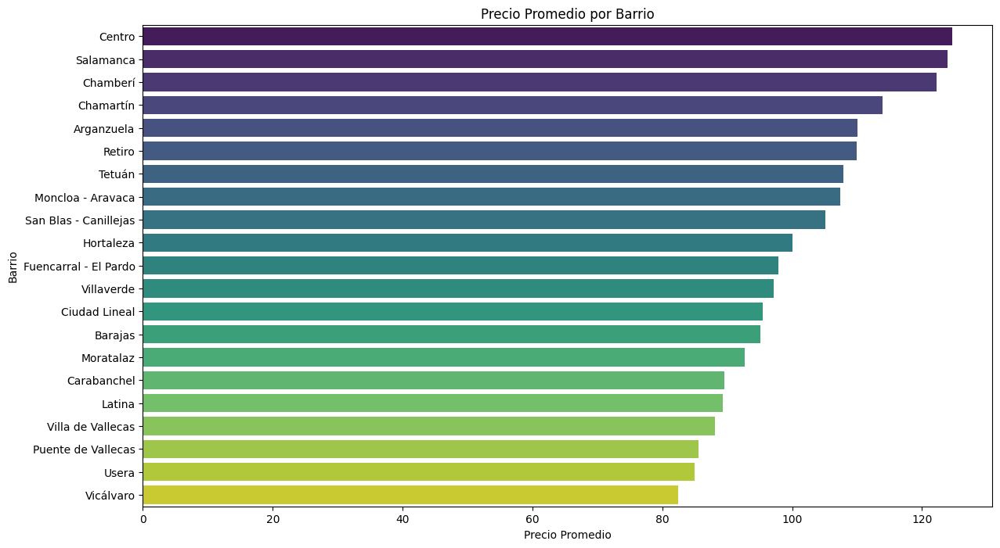

In [45]:
# Calculo el precio promedio por barrio
precio_promedio_por_barrio = listings_cleaned.groupby('neighbourhood_group_cleansed')['price'].mean().sort_values(ascending=False)

# Convierto la serie a un DataFrame para facilitar la visualización
precio_promedio_por_barrio_df = precio_promedio_por_barrio.reset_index()

# Creo una gráfica de barras horizontales para mostrar el precio promedio por barrio
plt.figure(figsize=(14, 8))
sns.barplot(data=precio_promedio_por_barrio_df, y='neighbourhood_group_cleansed', x='price', palette='viridis')
plt.title('Precio Promedio por Barrio')
plt.xlabel('Precio Promedio')
plt.ylabel('Barrio')
plt.show()

Podemos observar que los barrios más céntricos son los más costosos para alojarse y los barrios de la periféria de Madrid son más asequibles.

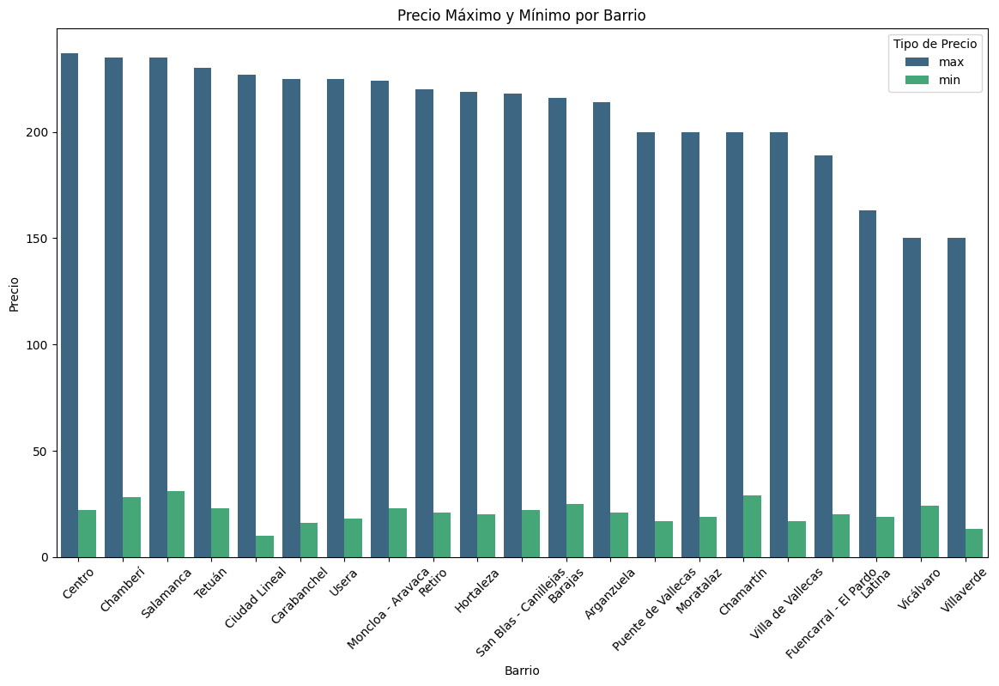

In [46]:
precio_max_min_por_barrio = listings_cleaned.groupby('neighbourhood_group_cleansed')['price'].agg(['max', 'min']).sort_values(by='max', ascending=False)

# Convierto la serie a un DataFrame para facilitar la visualización
precio_max_min_por_barrio_df = precio_max_min_por_barrio.reset_index()

# Doy valor a las columnas
precio_max_min_por_barrio_melted = precio_max_min_por_barrio_df.melt(id_vars='neighbourhood_group_cleansed', value_vars=['max', 'min'], var_name='Tipo de Precio', value_name='Precio')

# Creo una gráfica de barras vertical comparativa para mostrar el precio máximo y mínimo por barrio
plt.figure(figsize=(14, 8))
sns.barplot(data=precio_max_min_por_barrio_melted, x='neighbourhood_group_cleansed', y='Precio', hue='Tipo de Precio', palette='viridis')
plt.title('Precio Máximo y Mínimo por Barrio')
plt.xlabel('Barrio')
plt.ylabel('Precio')
plt.xticks(rotation=45)
plt.legend(title='Tipo de Precio')
plt.show()

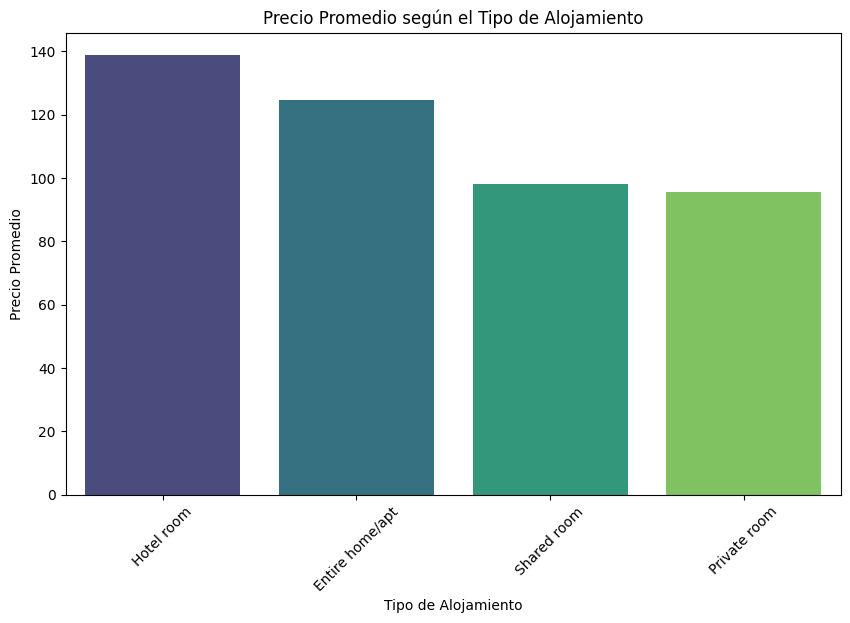

In [47]:
# Calculo el precio promedio según el tipo de alojamiento
precio_promedio_por_tipo = listings_cleaned.groupby('room_type')['price'].mean().sort_values(ascending=False)

# Convierto la serie a un DataFrame para facilitar la visualización
precio_promedio_por_tipo_df = precio_promedio_por_tipo.reset_index()

# Creo una gráfica de barras para mostrar el precio promedio según el tipo de alojamiento
plt.figure(figsize=(10, 6))
sns.barplot(data=precio_promedio_por_tipo_df, x='room_type', y='price', palette='viridis')
plt.title('Precio Promedio según el Tipo de Alojamiento')
plt.xlabel('Tipo de Alojamiento')
plt.ylabel('Precio Promedio')
plt.xticks(rotation=45)
plt.show()

In [48]:
precio_estadisticas_por_tipo = listings_cleaned.groupby('room_type')['price'].agg(['mean', 'max', 'min']).sort_values(by='mean', ascending=False)

# Renombro las columnas para mayor claridad
precio_estadisticas_por_tipo.columns = ['Precio Promedio', 'Precio Máximo', 'Precio Mínimo']

# Muestro la tabla
print(precio_estadisticas_por_tipo)

                 Precio Promedio  Precio Máximo  Precio Mínimo
room_type                                                     
Hotel room            138.954839          212.0           38.0
Entire home/apt       124.626828          236.0           24.0
Shared room            98.059524          150.0           16.0
Private room           95.469982          237.0           10.0


3.3 Análisis de los servicios

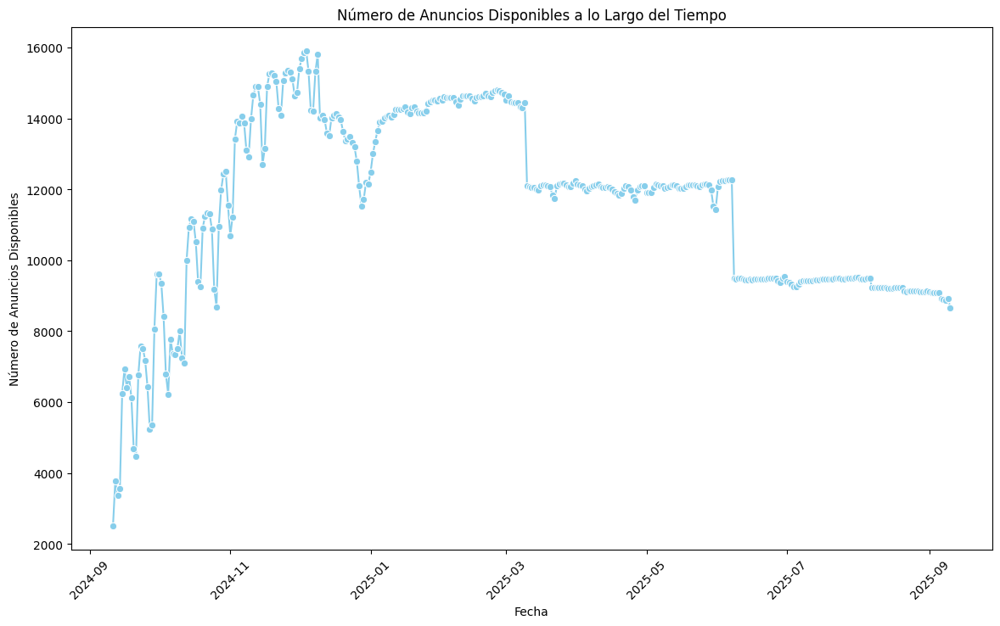

In [49]:
anuncios_por_fecha = calendar.groupby('date')['available'].sum().reset_index(name='count')
plt.figure(figsize=(14, 8))
sns.lineplot(data=anuncios_por_fecha, x='date', y='count', marker='o', color='skyblue')
plt.title('Número de Anuncios Disponibles a lo Largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Número de Anuncios Disponibles')
plt.xticks(rotation=45)
plt.show()

In [50]:
superhost_counts = listings_cleaned['host_is_superhost'].value_counts().reset_index()
superhost_counts.columns = ['host_is_superhost', 'count']
import plotly.graph_objects as go

# Creo un gráfico de anillo para mostrar la cantidad de anuncios por superhost
fig = go.Figure(data=[go.Pie(labels=superhost_counts['host_is_superhost'], values=superhost_counts['count'], 
                             hole=0.4, direction='clockwise', sort=False)])

# Ajusto el ángulo del gráfico para que sea un semicírculo
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text='Cantidad de Propiedades por Superhost',
                  annotations=[dict(text='Superhost', x=0.5, y=0.5, font_size=20, showarrow=False)],
                  showlegend=True, margin=dict(t=0, b=0, l=0, r=0))

# Muestro el gráfico
fig.show()

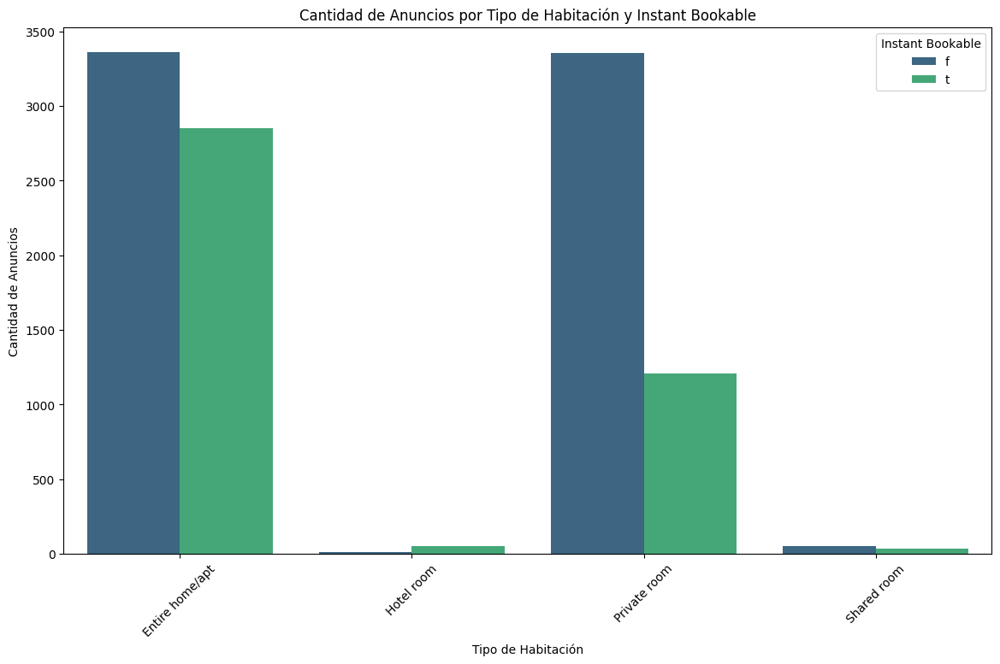

In [51]:
instant_bookable_counts = listings_cleaned.groupby(['room_type', 'instant_bookable']).size().reset_index(name='count')
# Creo una gráfica de barras apiladas para mostrar la cantidad de anuncios por tipo de habitación y si es instant_bookable
plt.figure(figsize=(14, 8))
sns.barplot(data=instant_bookable_counts, x='room_type', y='count', hue='instant_bookable', palette='viridis')
plt.title('Cantidad de Anuncios por Tipo de Habitación y Instant Bookable')
plt.xlabel('Tipo de Habitación')
plt.ylabel('Cantidad de Anuncios')
plt.xticks(rotation=45)
plt.legend(title='Instant Bookable')
plt.show()

In [52]:
anuncios_por_tiempo = listings_cleaned['host_response_time'].value_counts().reset_index()
anuncios_por_tiempo.columns = ['host_response_time', 'count']

# Creo un gráfico lineal para mostrar la cantidad de anuncios por tiempo de respuesta
fig = px.line(anuncios_por_tiempo, x='host_response_time', y='count', 
              title='Tiempo de Respuesta por cada Anuncio',
              markers=True)

# Muestro el gráfico
fig.show()

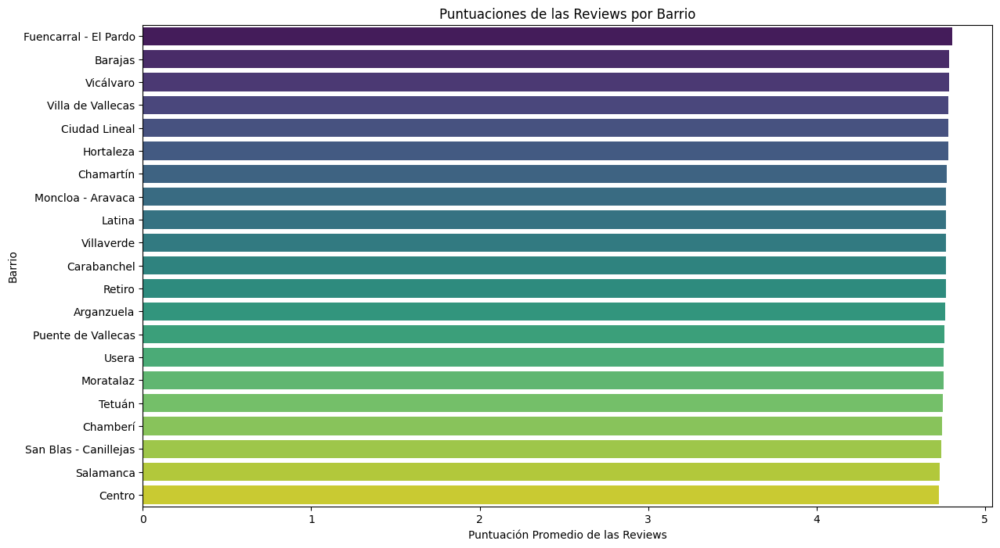

In [53]:
# Calculo la puntuación promedio de las reviews por barrio
review_scores_por_barrio = listings_cleaned.groupby('neighbourhood_group_cleansed')['review_scores_rating'].mean().sort_values(ascending=False).reset_index()
# Creo una gráfica de barras para mostrar las puntuaciones de las reviews por barrio
plt.figure(figsize=(14, 8))
sns.barplot(data=review_scores_por_barrio, x='review_scores_rating', y='neighbourhood_group_cleansed', palette='viridis')
plt.title('Puntuaciones de las Reviews por Barrio')
plt.xlabel('Puntuación Promedio de las Reviews')
plt.ylabel('Barrio')
plt.show()

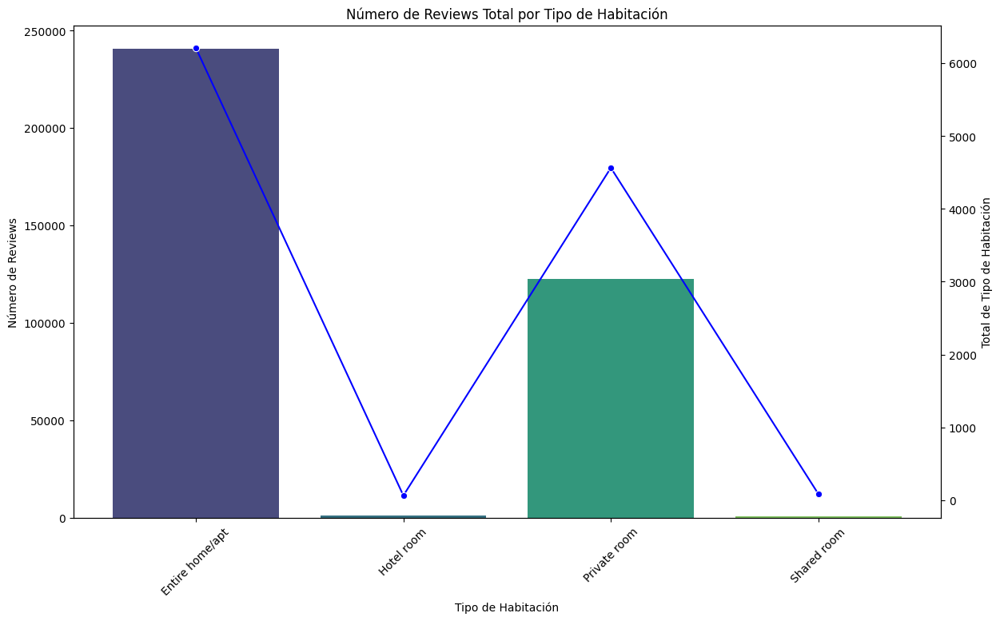

In [54]:
# Calculo el número total de reviews por tipo de habitación
reviews_por_tipo = listings_cleaned.groupby('room_type')['number_of_reviews'].sum().reset_index()

# Calculo el total de cada tipo de habitación
total_por_tipo = listings_cleaned['room_type'].value_counts().reset_index()
total_por_tipo.columns = ['room_type', 'total']
# Creo una figura y un eje
fig, ax1 = plt.subplots(figsize=(14, 8))

# Creo el primer gráfico de barras para el número de reviews por tipo de habitación
sns.barplot(data=reviews_por_tipo, x='room_type', y='number_of_reviews', palette='viridis', ax=ax1)
ax1.set_title('Número de Reviews Total por Tipo de Habitación')
ax1.set_xlabel('Tipo de Habitación')
ax1.set_ylabel('Número de Reviews')
ax1.tick_params(axis='x', rotation=45)

# Creo un segundo eje para el total de tipo de habitación
ax2 = ax1.twinx()
sns.lineplot(data=total_por_tipo, x='room_type', y='total', color='blue', marker='o', ax=ax2)
ax2.set_ylabel('Total de Tipo de Habitación')

# Muestro la gráfica
plt.show()

3.4 Análisis de las leyes

-La nueva normativa de apartamentos turísticos de Madrid fue aprobada el pasado año 2020 para frenar la transformación de pisos en alojamientos turísticos, especialmente en el centro de la urbe.

En la capital existían casi 17.000 viviendas de uso turístico (VUT) en agosto de dicho año, por lo que esta regularización afectó a un enorme porcentaje de las mismas. Pero.. ¿cuáles son los principales cambios de este texto?

3 puntos importantes de la nueva normativa de apartamentos turísticos de Madrid
Hay tres aspectos fundamentales en el Plan Especial de Hospedaje (oficialmente Plan Especial de regulación del uso de servicios terciarios en la clase de hospedaje y extraoficialmente ley ‘anti Airbnb’) de Madrid:

1. Acceso y ascensor independientes
Los pisos turísticos tendrán que contar con acceso y ascensor independientes, si fuera necesario, del resto de vecinos del edificio.

2. Recepción
Si los alojamientos turísticos están en los anillos 1 y 2, deben tener una recepción entre el exterior del edificio y el interior de la propiedad.

3. Aprobación municipal
Se necesita aprobación municipal para destinar un edificio entero al alquiler turístico.

IMPORTANTE: esta legislación limita a 90 días la posibilidad de alquilar una vivienda con fines turísticos sin permiso, por lo que a partir de ese plazo es obligatorio disponer de una licencia de uso terciario de hospedaje.

Vamos a comprobar si sobrepasan los 90 dias que límita la actual legislación

In [55]:
# Filtro el DataFrame para seleccionar solo las filas donde maximum_nights es superior a 90 días
viviendas_max_nights_superior_90 = listings_cleaned[listings_cleaned['maximum_nights'] > 90]

# Cuento el número de viviendas que cumplen esta condición
num_viviendas = viviendas_max_nights_superior_90.shape[0]

# Muestro el resultado
print(f"El número de viviendas con un número máximo de noches superior a 90 días es: {num_viviendas}")

El número de viviendas con un número máximo de noches superior a 90 días es: 7787


In [56]:
# Creo un gráfico circular para mostrar la distribución de tipos de habitación
fig = px.pie(viviendas_max_nights_superior_90, names='room_type', title='Distribución de Tipos de Habitación para Viviendas con Noches Superiores a 90 Días')

# Muestro el gráfico
fig.show()

In [58]:
import nltk
nltk.download('stopwords')
#take out empty comments (530)
reviews = reviews[reviews['comments'].notnull()]

#remove numbers
reviews['comments'] = reviews['comments'].str.replace('\d+', '') 
#all to lowercase
reviews['comments'] = reviews['comments'].str.lower()
#remove windows new line
reviews['comments'] = reviews['comments'].str.replace('\r\n', "")
#remove stopwords (from nltk library)
stop_english = stopwords.words("english")
reviews['comments'] = reviews['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_english)]))
# remove punctuation
reviews['comments'] = reviews['comments'].str.replace('[^\w\s]'," ")
# replace x spaces by one space
reviews['comments'] = reviews['comments'].str.replace('\s+', ' ')

reviews.comments.values[2] #print same comments again

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Usuario\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


'adel exceptionally welcoming host. ill stay kind enough accompany doctor translate me! really exceptionally pleasant person, laid back interesting, knowledgable articulate talker, even though claims english good! recommend staying highly.'

In [59]:
texts = reviews.comments.tolist()

vec = CountVectorizer().fit(texts)
bag_of_words = vec.transform(texts)
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

cvec_df = pd.DataFrame.from_records(words_freq, columns= ['words', 'counts']).sort_values(by="counts", ascending=False)
cvec_df.head(10)

,words,counts
4,de,652912
92,muy,568556
18,la,555237
124,br,552547
37,el,441038
2,en,398236
144,que,317476
39,es,310976
247,madrid,306731
63,great,293531


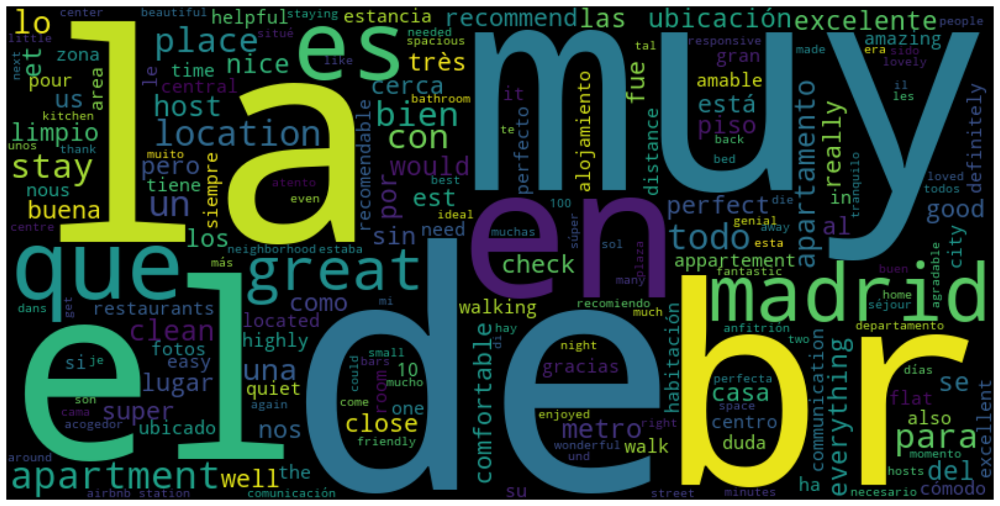

In [60]:
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

wordcloud = WordCloud(width=800, height=400)
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()